## 1. Data Preparation:

In [1]:
# Import libraries
import gzip
import json
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns



### 1.1. Unzip and convert to Df

After downloading the jsonl.gz files from https://amazon-reviews-2023.github.io/ , I unzip them and convert to DataFrame

In [2]:
import gzip
import json
import pandas as pd

def jsonl_gz_to_csv(input_file_path):
    # Load data from the .jsonl.gz file into a list of dictionaries
    data = []
    with gzip.open(input_file_path, 'rt', encoding='utf-8') as fp:
        for line in fp:
            data.append(json.loads(line.strip()))
    
    # Convert the list of dictionaries to a DataFrame
    df = pd.DataFrame(data)
    return df

# Use the function for each jsonl.gz file to convert them to DataFrame
user_review=jsonl_gz_to_csv("D:/Exeter_BA_2024/Business_Project_BEMM466_J_1_202425/El_modelling_practice/All_Beauty.jsonl.gz")
item_metadata=jsonl_gz_to_csv("D:/Exeter_BA_2024/Business_Project_BEMM466_J_1_202425/El_modelling_practice/meta_All_Beauty.jsonl.gz")

### 1.2. Merge 2 DataFrame into one main dataset: 'data'

Merge csv files: All_beauty (user_review) and meta_All_beauty (item_metadata), matching by 'parent_asin' column and create a new dataframe as 'data'

In [3]:
import pandas as pd

# Combine item_metadata into user_review, matching by 'parent_asin' column and create a new dataframe as 'data'
data = pd.merge(user_review, item_metadata, on='parent_asin', how='left') 

# Rename 'title' and 'image' columns for clarification:
data.rename(columns={'title_x': 'review_title'}, inplace=True)
data.rename(columns={'title_y': 'product_title'}, inplace=True)

data.rename(columns={'images_x': 'review_images'}, inplace=True)
data.rename(columns={'images_y': 'product_images'}, inplace=True)

# Convert the 'timestamp' column to datetime format, interpreting as milliseconds
data['timestamp'] = pd.to_datetime(data['timestamp'],unit='ms')

# Display the first few rows of the merged data to verify
data.info()

# Explore the earliest and latest dates in the 'timestamp' column
earliest_date = data['timestamp'].min()
latest_date = data['timestamp'].max()
earliest_date, latest_date

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701528 entries, 0 to 701527
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   rating             701528 non-null  float64       
 1   review_title       701528 non-null  object        
 2   text               701528 non-null  object        
 3   review_images      701528 non-null  object        
 4   asin               701528 non-null  object        
 5   parent_asin        701528 non-null  object        
 6   user_id            701528 non-null  object        
 7   timestamp          701528 non-null  datetime64[ns]
 8   helpful_vote       701528 non-null  int64         
 9   verified_purchase  701528 non-null  bool          
 10  main_category      701528 non-null  object        
 11  product_title      701528 non-null  object        
 12  average_rating     701528 non-null  float64       
 13  rating_number      701528 non-null  int64   

(Timestamp('2000-11-01 04:24:18'), Timestamp('2023-09-09 00:39:36.666000'))

### 1.3. Split the time period by Covid (11/3/2020) as the milestone

Official WHO Declaration: On March 11, 2020, the World Health Organization (WHO) declared COVID-19 a pandemic, signaling a major shift in how the world understood and responded to the virus. Before this declaration, the situation was still categorized as a global health emergency but not a pandemic.

WHO Statement (March 11, 2020): The Director-General of WHO, Dr. Tedros Adhanom Ghebreyesus, declared that COVID-19 had reached "pandemic" status after spreading globally with sustained community transmission in multiple countries.
Global Policy Changes: Following the pandemic declaration, nations around the world initiated stringent public health measures, including lockdowns, travel bans, and economic interventions. The policy shift marked a definitive separation in how governments, businesses, and individuals approached the virus—moving from precautionary actions to full-scale emergency measures.

Scientific and Societal Impact: March 2020 marks a point in time when the virus started spreading rapidly and uncontrollably across borders, leading to significant societal, economic, and psychological impacts worldwide. The day of the pandemic declaration, therefore, serves as a clear benchmark for the significant disruptions caused by COVID-19.

Citation:
World Health Organization (WHO). (2020, March 11). COVID-19 declared a pandemic. Retrieved from WHO Official Website

Imran, M., Alhasan, N. (2020). COVID-19 Pandemic and its Impact on Business Operations, Public Health, and Economic Systems. International Journal of Business Management and Economic Research, 11(3), 64-72.

In [12]:
import pandas as pd

# Split the dataset
data_before_covid = data[data['timestamp'] < '2020-03-11']
data_after_covid = data[data['timestamp'] >= '2020-03-11']


## 2. Data Preprocessing

### 2.1. Install packages and resources


In [5]:
# Download NLTK resources
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Use Swifter and Dask for faster apply operations due to the big current dataset: swifter automatically applies parallel processing to pandas operations. Install it via pip install swifter:

(if there is an error in the preprocessing step, open command promt and install the upgraded version:
#pip install --upgrade pandas dask swifter )

In [5]:
pip install swifter


Note: you may need to restart the kernel to use updated packages.


Use Dask for Parallelized Data Processing: Dask can split large dataframes into smaller chunks and process them in parallel:

In [6]:
pip install dask

Note: you may need to restart the kernel to use updated packages.


Use langdetect to filter out all non-english reviews, reducing noise in the preprocessed results

In [7]:
!pip install langdetect

  Using cached langdetect-1.0.9-py3-none-any.whl


### 2.2. Data Preprocessing: Tokenization, Lemmatization, and Stop-word removal

This code processes textual data from the dataset 'data' for two distinct tasks: sentiment analysis and topic modeling, with the help of Swifter, Dask and Langdetect, so each part of text preprocessing can be optimized. Moreover, I move stopwords and lemmatizer initialization outside the function to avoid reloading them on each iteration.


Step 1: Define custom stopwords for each process

So normally, the sentiment-carrying words like "like, love, great" are not really insightful for Topic Modeling and they can skew Topic Modeling Results. But they are really neccessary for sentiment analysis, defining the corresponding sentiment for each review. So that why I decide to define 2 separate customed stopwords for each task: Include sentiment words only in custom stopwords for topic modelling.

Step 2: Create a function to detect English reviews

Step 3: Create 2 preprocessing functions for each task, using different defined custom stopwords

Step 4: Filter only English reviews before applying 2 preprocessing to the dataset: one for topic modelling, one for sentiment analysis, drawing the results as 2 columns: 
- 'cleaned_text_for_sentiment'
- 'cleaned_text_for_topics'


(FYI: In this step, it takes about 30 - 40 minutes for Python to process, mainly due to the language detect function. If it's only Swifter and Dask, just about ~ 10 minutes)

In [6]:
# Import necessary libraries
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import swifter
from langdetect import detect, DetectorFactory
import re

#Step 1: Define custom stopwords for each process:
custom_stopwords_for_sentiment = {
    'product', 'amazon', 'buy', 'use', 'item', 'review', 'order',
    'really', 'much', 'very', 'quite', 'always', 'often', 'usually', 'maybe', 'probably',
    'basically', 'actually', 'though', 'however', 'also', 'even', 'get', 'got', 
    'you', 'we', 'they', 'he', 'she', 'it', 'us', 'them', 'i', 'me', 'my', 'your', 'their', 'mine', 'ours'
}
custom_stopwords_for_topics = {
'2','3','5','absolutely','actually','also','always','amazing','amazon','anything','apply','around','arrived','awesome','awful','b','back','bad','basically','best',
 'better','bit','body','bottle','bought','boy','br','broken','buy','cheap','child','children','clean','close','color','come','comfortable','cool','could','creature',
 'customer','cut','cute','daughter','day','de','dentist','describe','described','didnt','different','doesnt','does','dont','do','dry','e','easy','el','even','ever',
 'every','everything','exactly','excellent','expect','expected','face','fast','feel','find','fine','first','fit','found','full','get','girl','give','go','good',
 'got','great','hair','hard','he','help','hold','however','husband','i','im','it','item','ive','job','keep','la','lash','last','le','length','like','line','little',
 'long','look','love','loved','make','made','maybe','me','mine','model','month','mouth','much','muy','my','natural','need','never','new','nice','nothing','often',
 'okay','old','one','order','ours','people','perfect','picture','polish','probably','product','que','quite','really','receive','received','recommend','result',
 'review','ruth','say','scent','see','she','show','skin','small','smell','smooth','soft','something','son','stay','still','stuff','super','take','terrible',
 'thank','their','them','they','thick','thin','thing','things','think','thought','though','time','tried','try','two','una','unit','us','use','used','using',
 'usually','very','want','waste','way','we','wear','week','well','wife','without','work','worked','worst','worth','would','year','you','your'
}

# Create stopword sets for each task
stop_words_for_sentiment = set(stopwords.words('english')).union(custom_stopwords_for_sentiment)
stop_words_for_topics = set(stopwords.words('english')).union(custom_stopwords_for_topics)


# Initialize lemmatizer and seed for langdetect
lemmatizer = WordNetLemmatizer()
DetectorFactory.seed = 42

#Step 2: Function to check if text is in English
def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False

#Step 3: Define preprocessing functions
def preprocess_for_sentiment(text):
    text = ''.join([char if char.isalnum() or char.isspace() else '' for char in text]).lower()
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words_for_sentiment]
    return ' '.join(tokens)

def preprocess_for_topics(text):
    text = ''.join([char if char.isalnum() or char.isspace() else '' for char in text]).lower()
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words_for_topics]
    return ' '.join(tokens)

#Step 4: Filter the dataset for English-only reviews
data['is_english'] = data['text'].fillna('').swifter.apply(is_english)
data = data[data['is_english']].drop(columns=['is_english'])

# Apply 2 preprocessing to the dataset: one for topic modelling, one for sentiment analysis
data['cleaned_text_for_sentiment'] = data['text'].fillna('').swifter.apply(preprocess_for_sentiment)
data['cleaned_text_for_topics'] = data['text'].fillna('').swifter.apply(preprocess_for_topics)

# Display results
data[['text', 'cleaned_text_for_sentiment', 'cleaned_text_for_topics']].head(10)

Pandas Apply:   0%|          | 0/701528 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/647505 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/647505 [00:00<?, ?it/s]

,text,cleaned_text_for_sentiment,cleaned_text_for_topics
0,This spray is really nice. It smells really go...,spray nice smell good go fine trick say feel l...,spray smell go trick feel lot texture lot medi...
1,"This product does what I need it to do, I just...",need wish odorless soft coconut smell head sme...,wish odorless coconut head orange coffee offpu...
3,Felt synthetic,felt synthetic,felt synthetic
4,Love it,love,
5,The polish was quiet thick and did not apply s...,polish quiet thick apply smoothly let dry over...,quiet smoothly let overnight adding second coa...
6,Great for many tasks. I purchased these for m...,great many task purchased makeup removal makeu...,many task purchased makeup removal makeup wash...
7,These were lightweight and soft but much too s...,lightweight soft small liking would preferred ...,lightweight liking preferred together loc reas...
8,This is perfect for my between salon visits. I...,perfect salon visit using twice week month abs...,salon visit twice look feel silky follow instr...
9,I get Keratin treatments at the salon at least...,keratin treatment salon least 34 time year wou...,keratin treatment salon least 34 time afford m...
10,I was very disappointed when I got this facial...,disappointed facial scrub assumed like scrub w...,disappointed facial scrub assumed scrub wasnt ...


## 3. Customized Dictionary Construction

### 3.1. Preprocess Product Title to extract informative key words

This code is designed to preprocess product titles, extracting relevant keywords and then estimating the optimal number by analyzing the coverage of these keywords. After that, the defined number of keywords from product title will be combined with the standard corpora.Dictionary in the LDA later. 

In this step, I would like to figure out the estimated optimal number of keywords that contribute to 95% of the total frequency of words. The output is a list of keyword ranks that contribute to the specified coverage threshold and a plot showing the cumulative frequency of keywords: the "elbow" point where adding more keywords results in diminishing returns in terms of coverage.

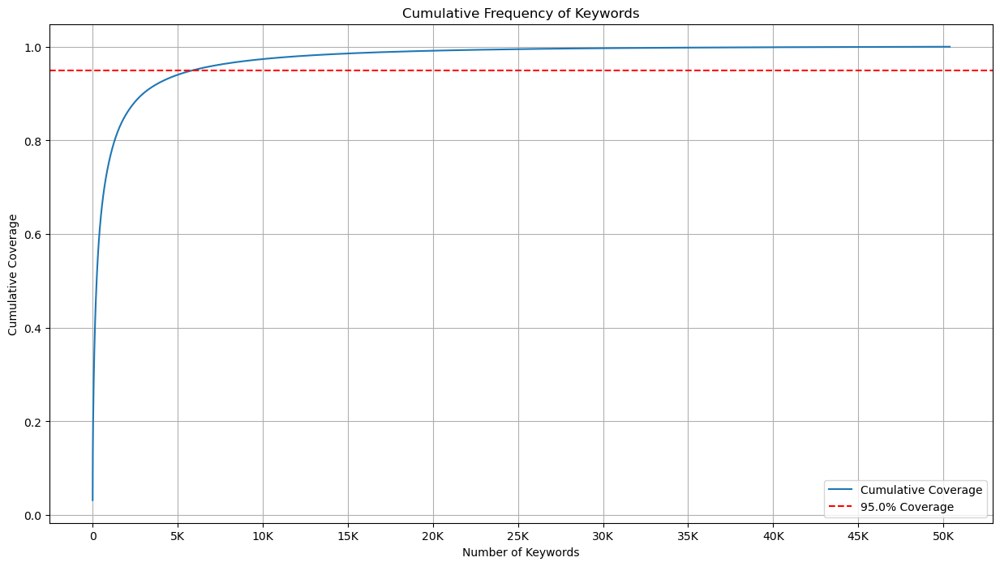

Estimated optimal number of keywords: [5906]


In [7]:
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
import re 
import numpy as np

# Preprocess Product Titles
def preprocess_titles(titles, stopwords):
    processed_keywords = []
    for title in titles:
        words = re.findall(r'\b\w+\b', title.lower())  # Tokenize
        filtered_words = [word for word in words if word not in stopwords and not word.isdigit()]
        processed_keywords.extend(filtered_words)
    return processed_keywords

# Analyze the coverage of keywords
def estimate_keyword_range(data, stopwords, coverage_threshold=0.95):
    from collections import Counter
    import matplotlib.pyplot as plt
    
    # Preprocess product titles to extract keywords
    processed_keywords = preprocess_titles(data['product_title'].dropna(), stopwords)
    keyword_freq = Counter(processed_keywords)
    
    # Calculate cumulative frequency
    total_freq = sum(keyword_freq.values())
    cumulative_freq = 0
    keyword_ranges = []
    for rank, (keyword, freq) in enumerate(keyword_freq.most_common(), start=1):
        cumulative_freq += freq
        if cumulative_freq / total_freq >= coverage_threshold:
            keyword_ranges.append(rank)
            break
    
    
    # Plot cumulative frequency for better interpretation.
    cumulative_values = []
    cumulative_total = 0
    for _, freq in keyword_freq.most_common():
        cumulative_total += freq
        cumulative_values.append(cumulative_total / total_freq)
    
    plt.figure(figsize=(15, 8))
    plt.plot(range(1, len(cumulative_values) + 1), cumulative_values, label="Cumulative Coverage")
    plt.axhline(y=coverage_threshold, color='r', linestyle='--', label=f'{coverage_threshold * 100}% Coverage')
    plt.title("Cumulative Frequency of Keywords")
    plt.xlabel("Number of Keywords")
    plt.xticks(np.arange(0, 55000, 5000), [f"{int(val/1000)}K" if val > 0 else "0" for val in np.arange(0, 55000, 5000)])
    plt.ylabel("Cumulative Coverage")
    plt.grid(True)
    plt.legend()
    plt.show()
    
    return keyword_ranges

# Run the function and draw the plot and result number:
keyword_range = estimate_keyword_range(data, custom_stopwords_for_topics)
print(f"Estimated optimal number of keywords: {keyword_range}")


### 3.2. Create the custom dictionary 
The keywords from product titles are extracted and added as a small, domain-specific dictionary with the number equals the optimal number as 'keyword_range' from the code in 3.1., then they will be merged with a larger dictionary derived from the tokenized review text by corpora Dictionary function

The final dictionary contains terms from both product titles and user reviews, ensuring comprehensive coverage for topic modeling.

- Top Keywords from Product Titles:
The dictionary includes the most frequent keywords extracted from the product_title column after preprocessing (removal of stopwords and irrelevant terms), contributing to the 95% cumulative frequency.

- Standard Corpora Dictionary (User Reviews):
The dictionary also includes the tokenized terms from the cleaned_text_for_topics column, which represent user reviews.

In [ ]:
# Define the optimal number of keywords and create the dictionary
def create_final_dictionary(data, top_n, stopwords):
    from gensim import corpora
    from collections import Counter

    # Preprocess product titles
    processed_keywords = preprocess_titles(data['product_title'].dropna(), stopwords)
    keyword_freq = Counter(processed_keywords)
    
    # Get the top-N keywords
    top_keywords = keyword_freq.most_common(top_n)
    
    # Tokenize cleaned_text_for_topics
    tokenized_texts = data['cleaned_text_for_topics'].dropna().str.split().tolist()
    cleaned_text_dictionary = corpora.Dictionary(tokenized_texts)
    
    # Prepare the keyword dictionary
    keyword_dict = corpora.Dictionary([[keyword for keyword, _ in top_keywords]])
    
    # Merge the dictionaries
    keyword_dict.merge_with(cleaned_text_dictionary)
    return keyword_dict

# Update the optimal number of keywords
optimal_keywords = int(keyword_range[0])  

# Create the final dictionary
final_dictionary = create_final_dictionary(data, optimal_keywords, custom_stopwords_for_topics)

# Save the final dictionary (optional)
#def save_dictionary(dictionary, filename="custom_dictionary.txt"):
    #dictionary.save_as_text(filename)
    #print(f"Dictionary saved to {filename}")

# Save the final dictionary
#save_dictionary(final_dictionary)



--
### 4. Topic Modelling (LDA)

This code applies Latent Dirichlet Allocation (LDA) to identify topics within a text corpus (reviews or documents) for two periods: before and after a crisis. It uses Gensim’s LdaMulticore model for topic modeling, making it faster to train the LDA model on large datasets.

Step 1: The function is created to train an LDA model on the cleaned_text_for_topics (preprocessed results for topic modelling). It contains:
- data: The input data containing the text documents.
- dictionary: take the formulated final dictionary above. It is used to convert the text data into a Bag-of-Words (BoW) format.
- num_topics: The number of topics the LDA model in the corpus (is 5).
- passes: The number of times the model will go through the entire corpus

The text is first tokenized using the str.split() method in Pandas.The str.split() method splits each document into a list of words, then the result is converted into a list of lists of tokens.

A BoW corpus is created by passing each tokenized text through the dictionary’s doc2bow method, which converts the words into a numeric format (a list of tuples, where each tuple contains the word ID and its frequency in the document).

Finally, the LDA model is trained using the LdaMulticore method from Gensim, where:
- corpus is the list of documents in BoW format.
- id2word is the dictionary used to map word IDs to words.
- num_topics specifies the number of topics the model should generate.
- passes=5 means the model will go through the entire corpus five times to refine the topic distribution.
- workers=4 indicates that four CPU cores will be used to speed up the training.

The function returns the trained LDA model (lda_model) and the BoW corpus (corpus).

Step 2: call the function for each period.

In [14]:
from gensim.models import LdaModel
from gensim.models import LdaMulticore

import pandas as pd

# Split the dataset
data_before_covid = data[data['timestamp'] < '2020-03-11']
data_after_covid = data[data['timestamp'] >= '2020-03-11']

#Step 1: Apply LDA to identify topics for each period
def apply_lda(data, dictionary, num_topics=5, passes=10):
    # Tokenize the cleaned_text_for_topics column
    tokenized_texts = data['cleaned_text_for_topics'].dropna().str.split().tolist()
    
    # Create a Bag-of-Words corpus using the dictionary
    corpus = [dictionary.doc2bow(text) for text in tokenized_texts]
    
    # Train the LDA model
    lda_model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=5, workers=4, random_state=42)
    #Gensim’s LdaMulticore allows parallel processing, which can significantly speed up training on multi-core systems.

    # Display the top words for each topic
    topics = lda_model.print_topics(num_words=10)
    for topic_id, topic in topics:
        print(f"Topic {topic_id}: {topic}")
    
    return lda_model, corpus

#Step 2: Call the function
# Apply LDA for data before covid
print("Topics Before Covid:")
lda_before_covid, corpus_before = apply_lda(data_before_covid, final_dictionary, num_topics=5, passes=10)

# Apply LDA for data after covid
print("\nTopics After the Covid:")
lda_after_covid, corpus_after = apply_lda(data_after_covid, final_dictionary, num_topics=5, passes=10)


Topics Before Covid:
Topic 0: 0.010*"money" + 0.008*"lash" + 0.007*"curl" + 0.005*"price" + 0.005*"disappointed" + 0.005*"star" + 0.005*"ordered" + 0.004*"definitely" + 0.004*"review" + 0.004*"put"
Topic 1: 0.021*"nail" + 0.010*"wig" + 0.009*"shave" + 0.009*"razor" + 0.007*"work" + 0.006*"shaver" + 0.006*"battery" + 0.006*"head" + 0.006*"gel" + 0.005*"foot"
Topic 2: 0.030*"quality" + 0.020*"price" + 0.014*"color" + 0.013*"beautiful" + 0.012*"came" + 0.011*"pretty" + 0.010*"gift" + 0.010*"look" + 0.009*"size" + 0.009*"love"
Topic 3: 0.052*"brush" + 0.029*"work" + 0.013*"soap" + 0.011*"smell" + 0.011*"shampoo" + 0.009*"beard" + 0.009*"comb" + 0.009*"spray" + 0.008*"make" + 0.008*"water"
Topic 4: 0.012*"oil" + 0.010*"product" + 0.009*"cream" + 0.009*"eye" + 0.006*"feel" + 0.006*"lotion" + 0.005*"mask" + 0.005*"result" + 0.005*"sensitive" + 0.005*"work"

Topics After the Covid:
Topic 0: 0.018*"lash" + 0.014*"money" + 0.007*"disappointed" + 0.006*"came" + 0.006*"eye" + 0.006*"cant" + 0.006*

##### Visualize topics by WordCloud

WordCloud for Topics Before Covid:


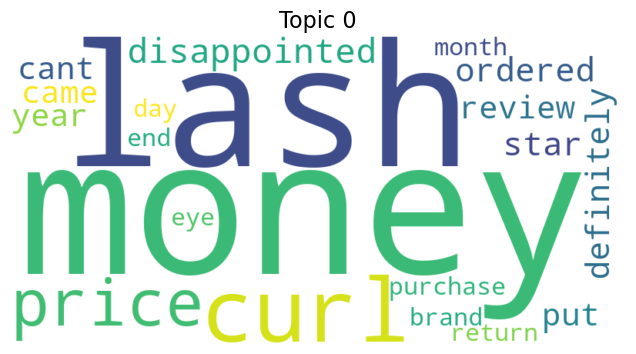

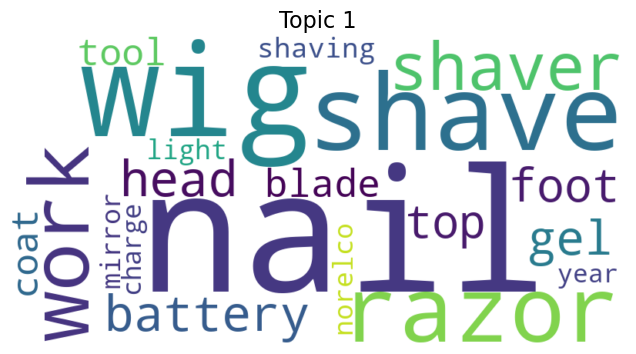

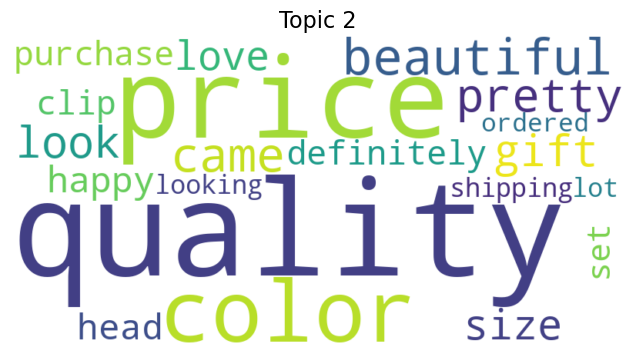

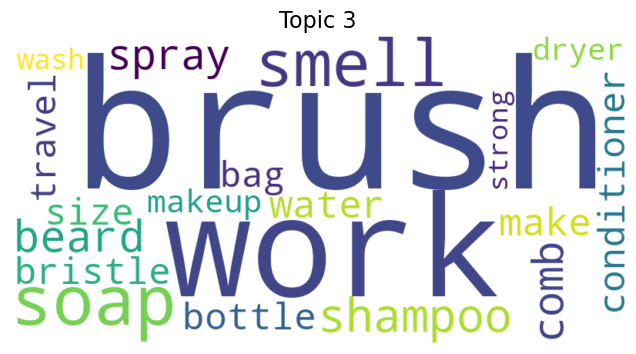

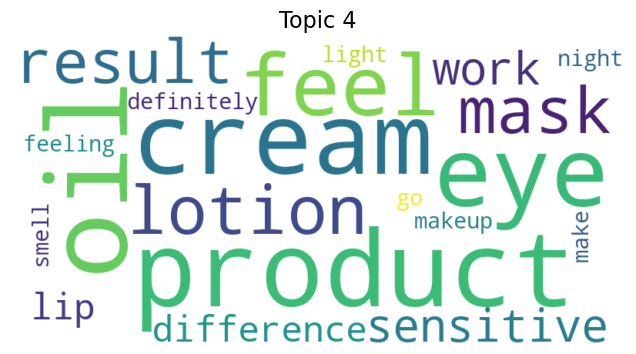

WordCloud for Topics After Covid:


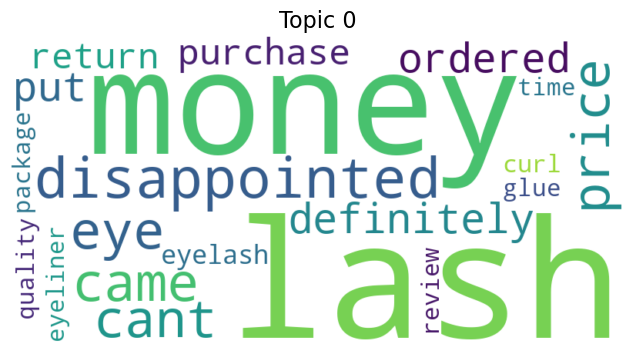

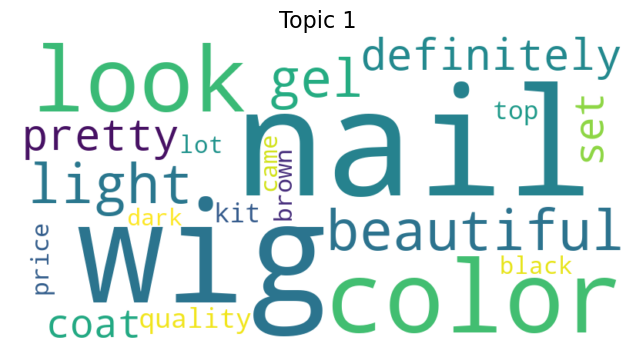

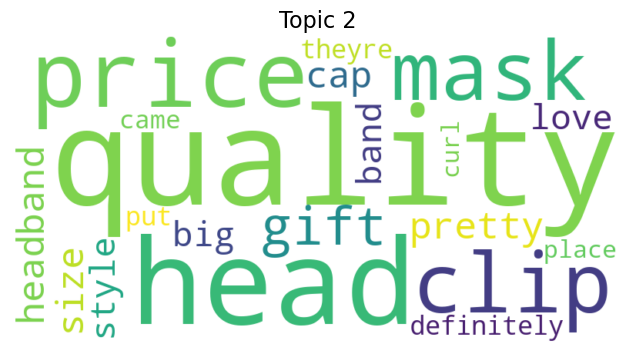

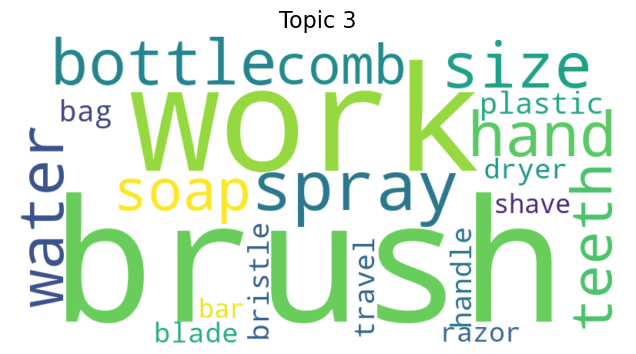

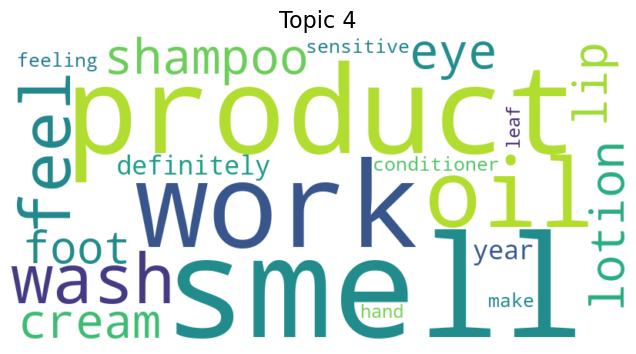

In [15]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to visualize topics with WordCloud
def visualize_topics_wordcloud(lda_model, num_topics=5):
    for topic_id in range(num_topics):
        # Extract the top words for the topic
        topic_words = dict(lda_model.show_topic(topic_id, topn=20))
        
        # Generate a word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)
        
        # Plot the word cloud
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic_id}", fontsize=16)
        plt.show()

# Visualize topics for "Before Covid"
print("WordCloud for Topics Before Covid:")
visualize_topics_wordcloud(lda_before_covid, num_topics=5)

# Visualize topics for "After Covid"
print("WordCloud for Topics After Covid:")
visualize_topics_wordcloud(lda_after_covid, num_topics=5)


##### Visualize by pyLDAvis

In [16]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


I integrate the use of pyLDAvis with Gensim to visualize the topics generated by LDA, allowing for the interactive exploration of the topics, and then I save the visualizations as HTML files that can be shared or viewed outside of the Jupyter Notebook

In [17]:
import pyLDAvis
import pyLDAvis.gensim_models
from IPython.display import display, HTML

# Enable pyLDAvis inline for Jupyter Notebooks and create the interactive visualizations
pyLDAvis.enable_notebook()

# Function to prepare and display pyLDAvis visualization
def visualize_topics_pyLDAvis(lda_model, corpus, dictionary, title="LDA Topics", file_name="lda_vis.html"):
    lda_vis_data = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
    print(f"{title}:")
    display(lda_vis_data)

    # Save visualization as an HTML file. It converts the interactive plot into an HTML file, allowing to explore the topics in an interactive format outside the notebook.
    pyLDAvis.save_html(lda_vis_data, file_name)
    print(f"Visualization saved as: {file_name}")
    
    link = f'<a href="{file_name}" target="_blank">Click here to view the {title} visualization</a>' # Create HTML link to the file
    display(HTML(link))



# Display visualization for "Before Covid"
visualize_topics_pyLDAvis(
    lda_model=lda_before_covid,
    corpus=corpus_before,
    dictionary=final_dictionary,
    title="Interactive Visualization for Topics Before Covid",
    file_name="lda_before_covid.html"
)

# Display visualization for "After Covid"
visualize_topics_pyLDAvis(
    lda_model=lda_after_covid,
    corpus=corpus_after,
    dictionary=final_dictionary,
    title="Interactive Visualization for Topics After Covid",
    file_name="lda_after_covid.html"
)



Interactive Visualization for Topics Before Covid:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.141313 -0.053337       1        1  25.369631
0      0.035426 -0.121711       2        1  24.438411
1     -0.021024 -0.095219       3        1  17.772678
2      0.239841  0.071701       4        1  16.908406
3     -0.112931  0.198566       5        1  15.510874, topic_info=           Term          Freq         Total Category  logprob  loglift
951       brush  37492.000000  37492.000000  Default  30.0000  30.0000
4247    quality  24216.000000  24216.000000  Default  29.0000  29.0000
3593       nail  15923.000000  15923.000000  Default  28.0000  28.0000
6056       work  30864.000000  30864.000000  Default  27.0000  27.0000
6080      color  10250.000000  10250.000000  Default  26.0000  26.0000
...         ...           ...           ...      ...      ...      ...
4040    plastic   2478.405649   6148.029784   Topic5  -5.5951   0.9551
3193        lot   2587.621060  14157.569414   Topic5  -5.5519   0.1641
3737        oil   2521.447552  15387.124847   Topic5  -5.5778   0.0549
5799  wonderful   2278.996608   5571.771665   Topic5  -5.6789   0.9697
6306     enough   2287.844836  10379.714292   Topic5  -5.6751   0.3514

[356 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
309       1  0.998935   absorbs
327       1  0.999819      acne
328       3  0.999575   acrylic
356       4  0.999314  adorable
5985      1  0.157989   another
...     ...       ...       ...
6007      3  0.255602      year
6007      4  0.000086      year
6007      5  0.084394      year
5897      4  0.993010    zipper
5897      5  0.006055    zipper

[756 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 1, 2, 3, 4])

Visualization saved as: lda_before_covid.html


Interactive Visualization for Topics After Covid:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.009084 -0.078272       1        1  26.390606
4      0.196177 -0.060100       2        1  24.551335
3      0.075046  0.174799       3        1  17.134969
2     -0.157487  0.110737       4        1  16.407498
1     -0.104651 -0.147164       5        1  15.515592, topic_info=        Term          Freq         Total Category  logprob  loglift
3593    nail  18599.000000  18599.000000  Default  30.0000  30.0000
5758     wig  16128.000000  16128.000000  Default  29.0000  29.0000
951    brush  16417.000000  16417.000000  Default  28.0000  28.0000
6165    lash  14373.000000  14373.000000  Default  27.0000  27.0000
6056    work  18491.000000  18491.000000  Default  26.0000  26.0000
...      ...           ...           ...      ...      ...      ...
4297     red   1549.064024   2503.121631   Topic5  -5.7045   1.3834
3988   photo   1495.746910   2298.345190   Topic5  -5.7395   1.4338
3289    many   1561.747294   6909.854076   Topic5  -5.6963   0.3762
5988    come   1536.133666   5710.070633   Topic5  -5.7129   0.5504
4110  powder   1499.866967   2540.441353   Topic5  -5.7368   1.3364

[369 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
8805      1  0.980081       18
8805      2  0.001278       18
8805      4  0.011500       18
8805      5  0.006389       18
309       2  0.999151  absorbs
...     ...       ...      ...
6007      1  0.362066     year
6007      2  0.570068     year
6007      3  0.065727     year
6007      4  0.000161     year
6007      5  0.002099     year

[793 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 5, 4, 3, 2])

Visualization saved as: lda_after_covid.html


## 5. Sentiment Analysis
Use VADER for sentiment analysis on the cleaned_text for each period.

In [32]:
!pip install vaderSentiment

  Obtaining dependency information for vaderSentiment from https://files.pythonhosted.org/packages/76/fc/310e16254683c1ed35eeb97386986d6c00bc29df17ce280aed64d55537e9/vaderSentiment-3.3.2-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/126.0 kB ? eta -:--:--
   ------ -------------------------------- 20.5/126.0 kB 330.3 kB/s eta 0:00:01
   ------------ -------------------------- 41.0/126.0 kB 487.6 kB/s eta 0:00:01
   -------------------------------------- 126.0/126.0 kB 925.7 kB/s eta 0:00:00


##### Performing VADER sentiment analysis on the topics extracted by an LDA model before and after Covid:

The code analyzes the sentiment of each document in a given corpus using VADER sentiment analysis, classifying sentiment into positive, negative, or neutral categories. After that, sentiment analysis is performed for two periods (before and after Covid). The results for each period, with sentiment scores for each document (positive, negative, neutral, and compound) are displayed in separate DataFrames for comparison.


Step 1: The SentimentIntensityAnalyzer (SIA) from vaderSentiment provides a compound sentiment score (ranging from -1 to 1) for each piece of text, indicating whether the sentiment is negative, neutral, or positive for the texts related to each topic.

Step 2: the function analyze_sentiments_vader is created with two components: 
- corpus: the collection of documents, each document in a "Bag of Words" format (as a list of tuples where each tuple contains a word ID and its frequency in that document).
- lda_model: LDA model formulated in previous step, helping to convert the BOW into meaningful words.

Step 3: Loop through each document in BoW format (each document is represented as a list of words (or word IDs) along with their frequencies) in the corpus, the function convert the document (BOW) to readable text by lda_model, returning the original text of the document (called document_text)

Step 4: Perform VADER's sentiment analysis, analyzing the text and breaks it down into four scores:
- Positive score: How positive the document is.
- Negative score: How negative the document is.
- Neutral score: How neutral the document is.
- Compound score: This is an overall score that summarizes the sentiment (positive or negative) of the document.

The function returns the result as DataFrame format.

Step 5: The analyze_sentiments_vader function is called for the topics "Before Covid" and "After Covid". It processes the corpus and the LDA model for these periods and outputs the sentiment analysis results in a DataFrame.

In [18]:
#Step 1: import libraries:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

#Step 2: Perform Sentiment Analysis on each document in the corpus
def analyze_sentiments_vader(corpus, lda_model):
    sentiment_results = []  # List to store sentiment results
    
    #Step 3: Convert BoW documents back to readable text:
    for doc_bow in corpus:
        document_text = " ".join([lda_model.id2word[word_id] for word_id, _ in doc_bow])
        
        #Step 4: Perform VADER sentiment analysis
        sentiment = analyzer.polarity_scores(document_text)
        
        # Append the sentiment and document information
        sentiment_results.append({
            'document': document_text,
            'compound': sentiment['compound'],
            'positive': sentiment['pos'],
            'neutral': sentiment['neu'],
            'negative': sentiment['neg']
        })
    
    # Convert sentiment results into DataFrame for easy analysis
    sentiment_df = pd.DataFrame(sentiment_results)
    return sentiment_df

#Step5: Call the function with 2 periods:
#Sentiment analysis for topics before Covid
sentiment_before_covid = analyze_sentiments_vader(corpus_before, lda_before_covid)
print("\nSentiment Analysis for Topics Before Covid:")
display(sentiment_before_covid)

# Sentiment analysis for topics after Covid
sentiment_after_covid = analyze_sentiments_vader(corpus_after, lda_after_covid)
print("\nSentiment Analysis for Topics After Covid:")
display(sentiment_after_covid)



Sentiment Analysis for Topics Before Covid:


,document,compound,positive,neutral,negative
0,along area bag c eye faster instead looking mo...,0.8481,0.199,0.765,0.036
1,board christmas clipper file gift kit leather ...,0.4404,0.108,0.892,0.000
2,act air bar brushing care combo course fill fl...,0.9448,0.351,0.601,0.048
3,beyond brush case electric lightweight manual ...,0.2960,0.114,0.833,0.053
4,many color diverse,0.0000,0.000,1.000,0.000
...,...,...,...,...,...
368944,curl dyed five perfectly shedding star tangling,0.6369,0.412,0.588,0.000
368945,conditioner shampoo,0.0000,0.000,1.000,0.000
368946,pretty whole feel disappointed thinner,0.0258,0.344,0.323,0.333
368947,crown fragrance gift jewel let mature princess...,0.8979,0.598,0.402,0.000



Sentiment Analysis for Topics After Covid:


,document,compound,positive,neutral,negative
0,brand chemical lot medium spray stick texture ...,-0.4588,0.000,0.778,0.222
1,coconut coffee head light odorless orange gran...,0.7579,0.484,0.516,0.000
2,felt synthetic,0.0000,0.000,1.000,0.000
3,,0.0000,0.000,0.000,0.000
4,coat let overnight quiet second smoothly addin...,0.0000,0.000,1.000,0.000
...,...,...,...,...,...
278551,brush,0.0000,0.000,1.000,0.000
278552,light money,0.0000,0.000,1.000,0.000
278553,beginner energy highly looking quality recomme...,0.4877,0.294,0.706,0.000
278554,care completely feel disappointed watered unsa...,-0.4364,0.241,0.301,0.458


## 6. Topic-Sentiment Mixture (TSM)
Topic-Sentiment Mixture (TSM) analysis combines topic modeling (via LDA) with sentiment analysis (using the VADER sentiment analyzer) to evaluate the sentiment associated with each topic in a set of documents. This function aims to link each document's sentiment (whether it's positive, neutral, or negative) to its most relevant topic and then calculate the percentage of documents in each sentiment category (positive, neutral, or negative) for each topic.

Step 1: The function begins by creating a dictionary (topic_sentiment_counts) where each topic will have counts for: Positive, Neutral, Negative documents and Total documents (the total number of documents for each topic). It sets this up for all the topics that exist (num_topics).

Step 2: Assign each document to its dominant topic and categorize its sentiment:
For each document in the corpus (which is a collection of documents in Bag of Words format), the function uses the lda_model to determine which topic the document is most strongly related to, by looking at the topic distribution for each document and selecting the dominant topic (the topic with the highest probability).
Then, for the same document, it retrieves its sentiment data from the sentiment_df DataFrame (which contains sentiment scores from VADER analysis).
Based on the compound score from VADER, the document is classified into one of three categories:
- Positive: If the compound score is greater than or equal to 0.05.
- Negative: If the compound score is less than or equal to -0.05.
- Neutral: If the compound score is between -0.05 and 0.05.

The function then updates the sentiment counts for the dominant topic. It increments the count of positive, neutral, or negative documents for that topic and also increases the total document count for that topic.

Step 3: The function converts the sentiment counts into percentages for each topic before returning the DataFrame, which shows the percentage of positive, neutral, and negative documents for each topic, along with the total number of documents for each topic.



In [19]:
def topic_sentiment_mixture(corpus, lda_model, sentiment_df, num_topics):
    #Step 1: Initialize a dictionary to store sentiment counts per topic
    topic_sentiment_counts = {i: {"Positive": 0, "Neutral": 0, "Negative": 0, "Total_Documents": 0} for i in range(num_topics)}
    
    #Step 2: Assign each document to its dominant topic based on LDA model and categorize sentiment
    for i, doc_bow in enumerate(corpus):
        topic_distribution = lda_model.get_document_topics(doc_bow)  # Get topic distribution
        dominant_topic = max(topic_distribution, key=lambda x: x[1])[0]  # Dominant topic
        
        # Retrieve sentiment data for the document
        sentiment_row = sentiment_df.iloc[i]
        compound_score = sentiment_row['compound']
        
        # Categorize sentiment based on compound score
        if compound_score >= 0.05:
            sentiment_category = "Positive"
        elif compound_score <= -0.05:
            sentiment_category = "Negative"
        else:
            sentiment_category = "Neutral"
        
        # Update sentiment counts for the dominant topic
        topic_sentiment_counts[dominant_topic][sentiment_category] += 1
        topic_sentiment_counts[dominant_topic]["Total_Documents"] += 1
    
    #Step 3: Convert sentiment counts to a DataFrame with percentages
    topic_sentiment_df = pd.DataFrame([
        {
            "Topic": topic,
            "Positive (%)": (counts["Positive"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Neutral (%)": (counts["Neutral"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Negative (%)": (counts["Negative"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Total Documents": counts["Total_Documents"]
        }
        for topic, counts in topic_sentiment_counts.items()
    ])
    
    return topic_sentiment_df

# Topic Sentiment Mixture function for the period before Covid
tsm_before_covid = topic_sentiment_mixture(corpus_before, lda_before_covid, sentiment_before_covid, num_topics=5)
print("\nTopic Sentiment Mixture for Topics Before Covid:")
print(tsm_before_covid)

# Topic Sentiment Mixture function for the period after Covid
tsm_after_covid = topic_sentiment_mixture(corpus_after, lda_after_covid, sentiment_after_covid, num_topics=5)
print("\nTopic Sentiment Mixture for Topics After Covid:")
print(tsm_after_covid)


Topic Sentiment Mixture for Topics Before Covid:
   Topic  Positive (%)  Neutral (%)  Negative (%)  Total Documents
0      0     33.510750    46.097003     20.392247           100141
1      1     44.751962    33.612036     21.636002            44731
2      2     54.763819    36.117371      9.118810            88301
3      3     45.779351    42.562163     11.658486            62135
4      4     54.605451    30.200568     15.193982            73641

Topic Sentiment Mixture for Topics After Covid:
   Topic  Positive (%)  Neutral (%)  Negative (%)  Total Documents
0      0     31.632230    43.766142     24.601628            82084
1      1     51.246147    37.207271     11.546582            41207
2      2     49.838803    38.520611     11.640585            55212
3      3     42.734199    39.884312     17.381490            42528
4      4     52.691873    31.400261     15.907866            57525


##### Visualize the TSM results with bar plot, observing the sentiment change before and after Covid

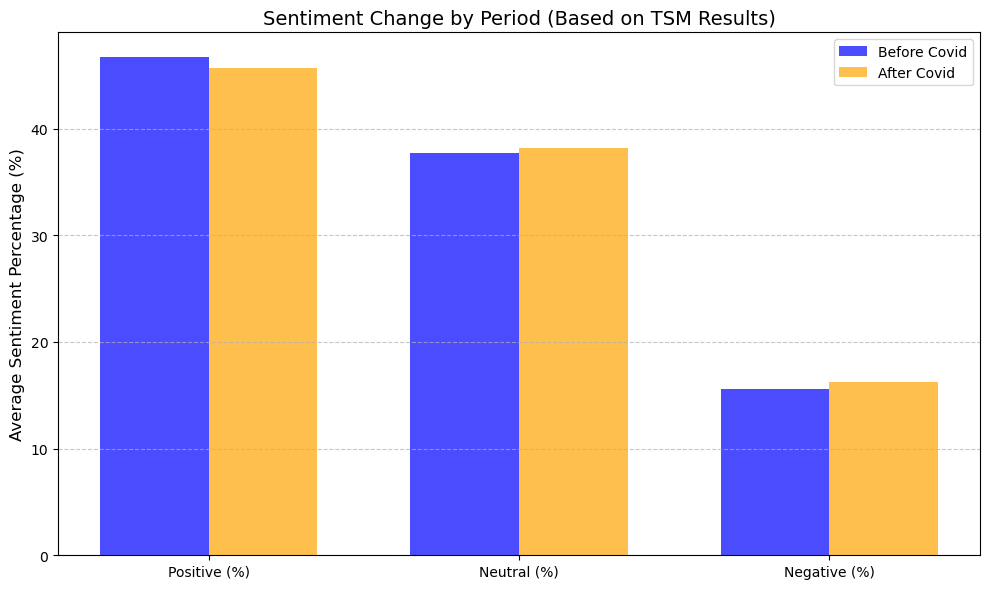

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for sentiment change by period using TSM results
def plot_sentiment_change_by_period(tsm_before, tsm_after):
    # Aggregate sentiment percentages for each period
    before_avg = {
        "Positive (%)": tsm_before["Positive (%)"].mean(),
        "Neutral (%)": tsm_before["Neutral (%)"].mean(),
        "Negative (%)": tsm_before["Negative (%)"].mean(),
    }
    after_avg = {
        "Positive (%)": tsm_after["Positive (%)"].mean(),
        "Neutral (%)": tsm_after["Neutral (%)"].mean(),
        "Negative (%)": tsm_after["Negative (%)"].mean(),
    }

    # Plot settings
    sentiments = ["Positive (%)", "Neutral (%)", "Negative (%)"]
    before_values = [before_avg[sent] for sent in sentiments]
    after_values = [after_avg[sent] for sent in sentiments]

    x = np.arange(len(sentiments))  # Sentiment categories
    width = 0.35  # Width of bars

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot bars for Before and After Covid
    ax.bar(x - width / 2, before_values, width, label="Before Covid", color="blue", alpha=0.7)
    ax.bar(x + width / 2, after_values, width, label="After Covid", color="orange", alpha=0.7)

    # Customize the plot
    ax.set_title("Sentiment Change by Period (Based on TSM Results)", fontsize=14)
    ax.set_ylabel("Average Sentiment Percentage (%)", fontsize=12)
    ax.set_xticks(x)
    ax.set_xticklabels(sentiments)
    ax.legend(loc="upper right")
    ax.grid(axis="y", linestyle="--", alpha=0.7)

    plt.tight_layout()
    plt.show()

# Plot sentiment change by period
plot_sentiment_change_by_period(tsm_before_covid, tsm_after_covid)


##### Visualize word clouds for the sentiment distribution of defined topics from LDA

This function uses the WordCloud class from the wordcloud library to generate word clouds, and matplotlib to display the results of the sentiment distribution of topics identified by the Latent Dirichlet Allocation (LDA) model before and after Covid. The word clouds are created based on sentiment categories (Positive, Neutral, Negative) and help to visually understand the most frequent words associated with each sentiment within each topic.


The function 'generate_wordclouds_for_sentiments' is generated, taking in:
- tsm: Topic Sentiment Mixture data.
- lda_model: The trained LDA model, which identifies topics in the corpus.
- corpus: The collection of documents in Bag-of-Words (BOW) format.
- sentiment_category: The sentiment category (Positive, Neutral, or Negative).
- num_topics: The total number of topics identified by the LDA model.


Then, the function loops over each topic, extracting documents that belong to the topic (based on the LDA model’s topic distribution).
After that, the document is analyzed using the VADER sentiment analysis (analyzer.polarity_scores) to determine if the sentiment falls into the chosen category (Positive, Neutral, or Negative).
- Positive Sentiment: If the compound score is ≥ 0.05.
- Neutral Sentiment: If the compound score is between -0.05 and 0.05.
- Negative Sentiment: If the compound score is ≤ -0.05.

Once all documents for the current topic and sentiment category are processed, the function combines all the relevant document texts into one large string (combined_text).
It then generates a word cloud for the combined text using the WordCloud class and matplotlib, which displays the most frequent words in that sentiment category for the topic.



Word Clouds Before Covid:


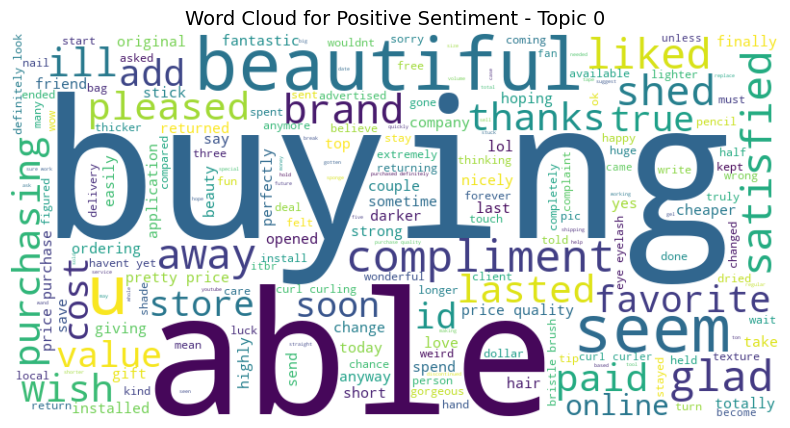

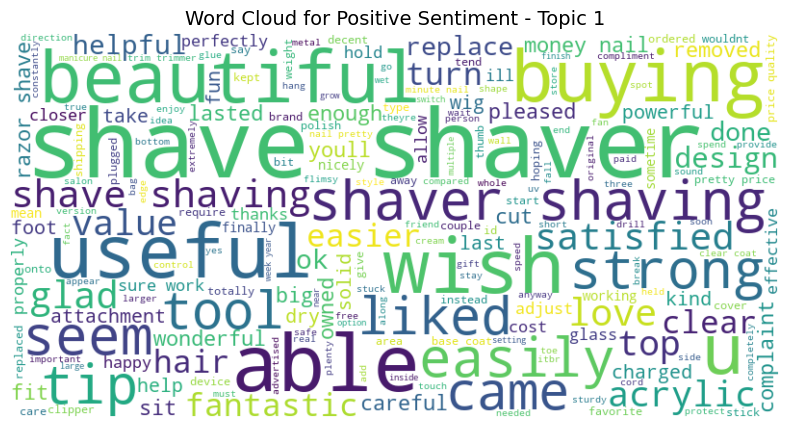

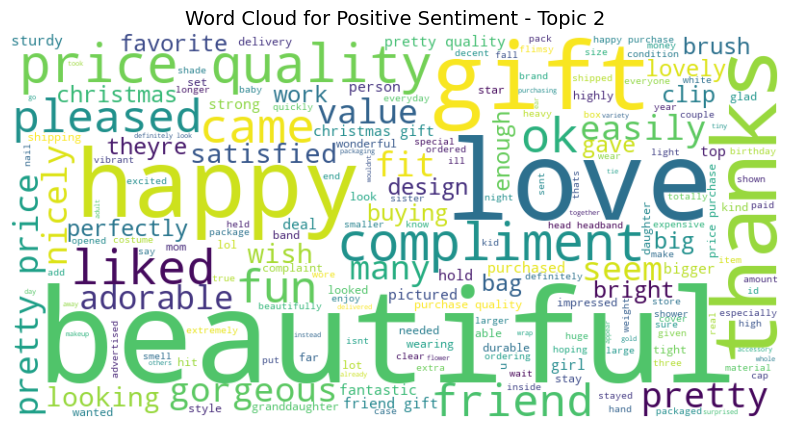

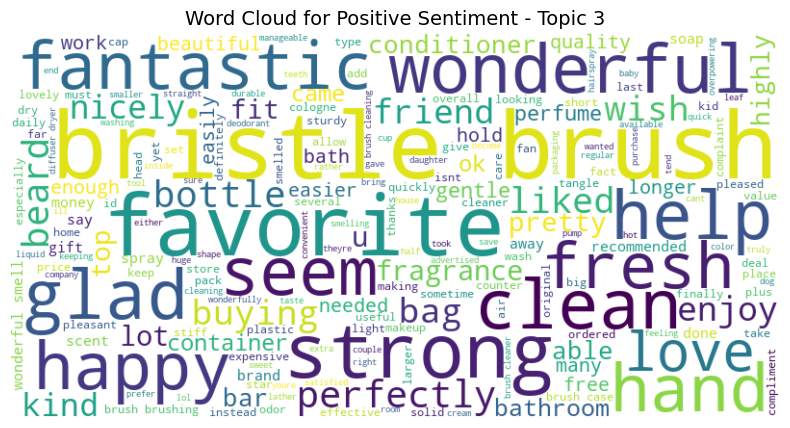

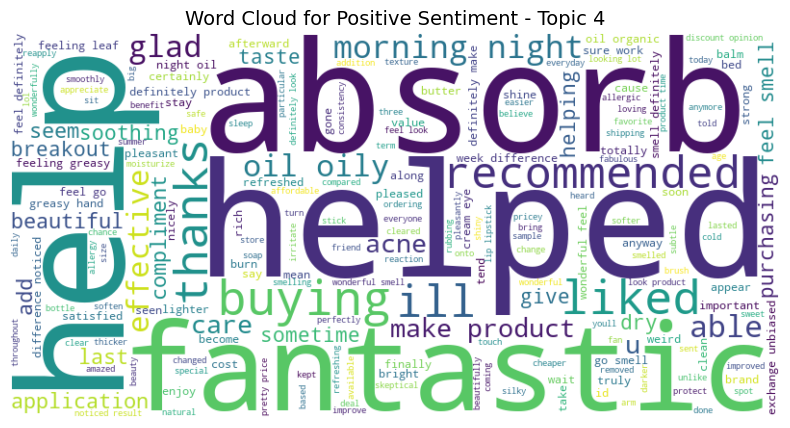

...

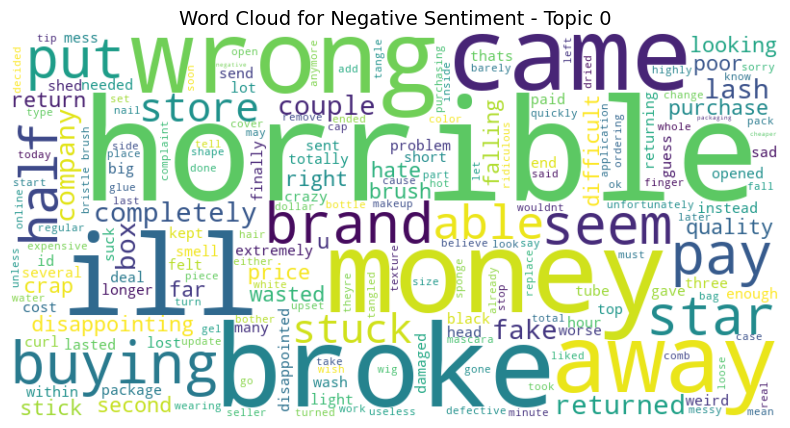

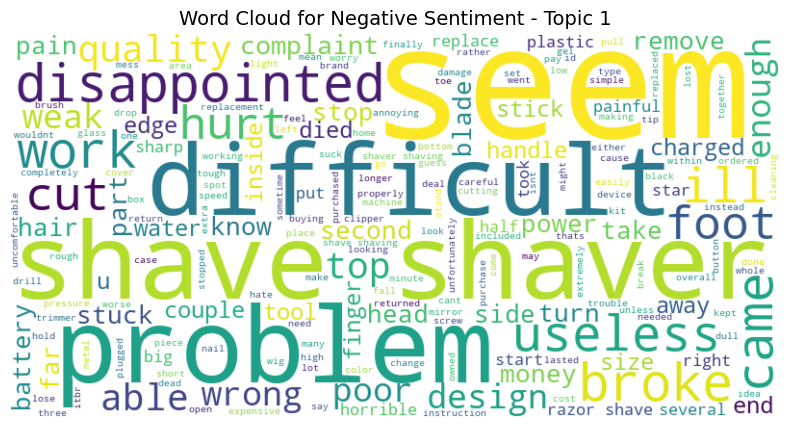

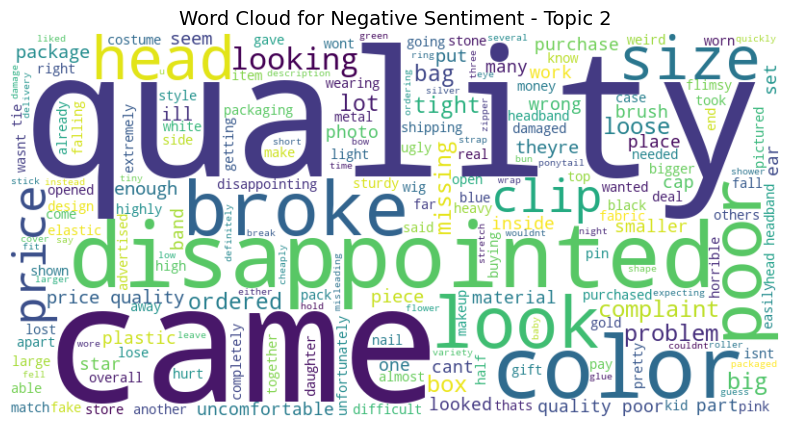

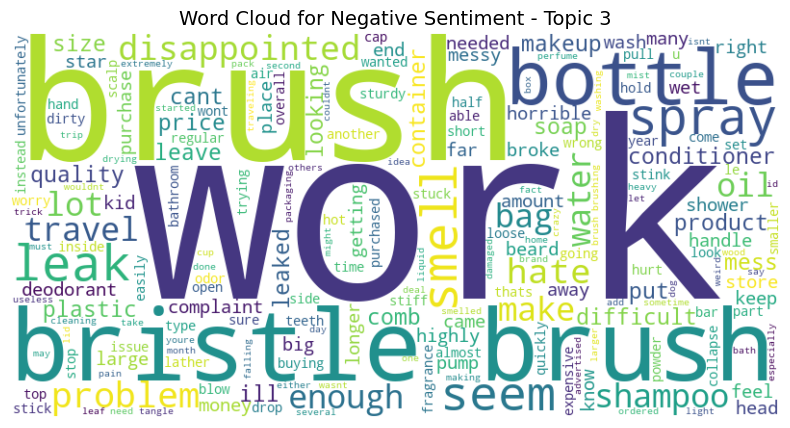

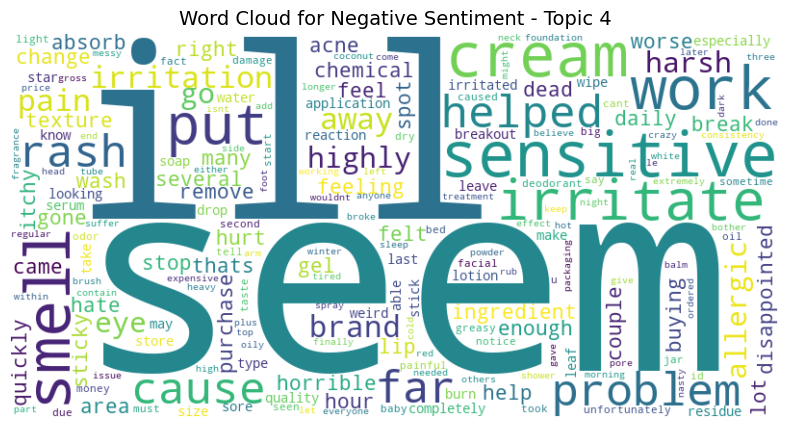


Word Clouds After Covid:


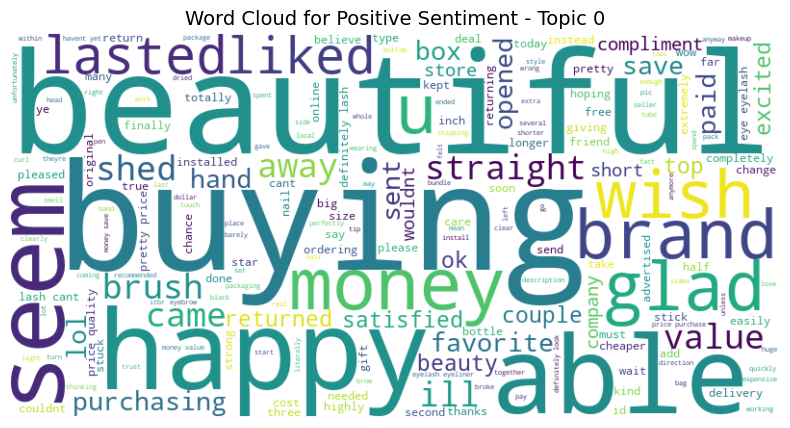

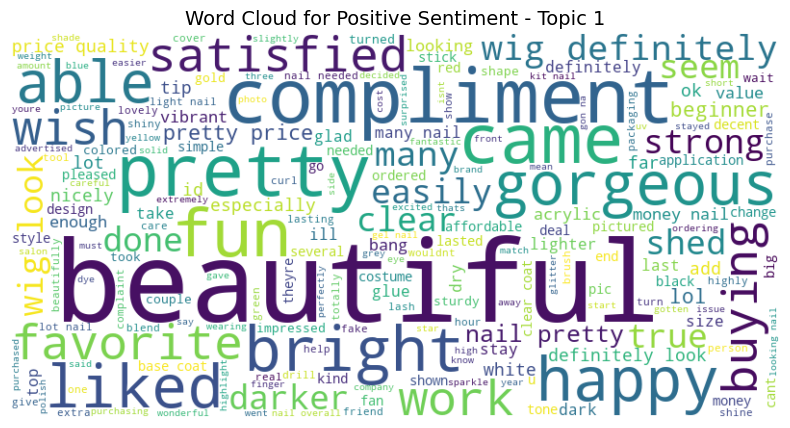

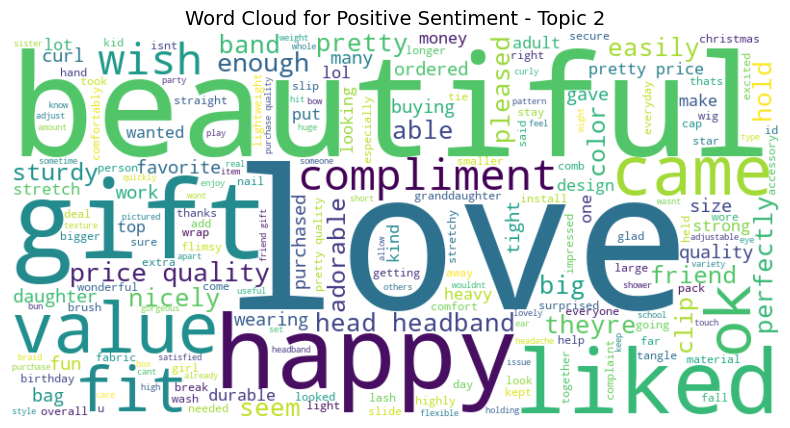

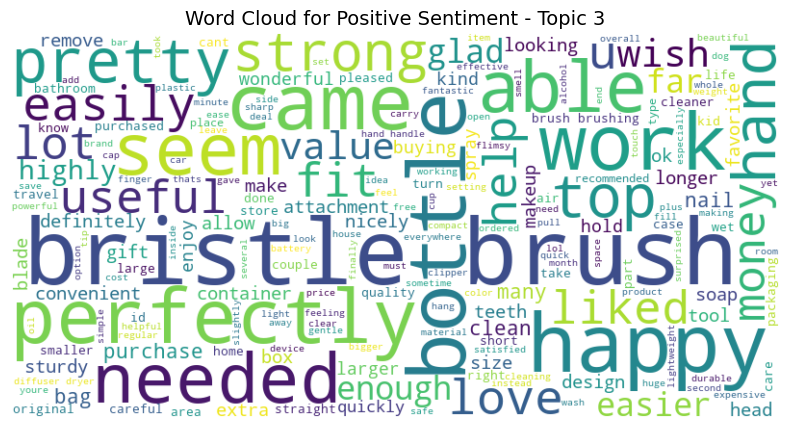

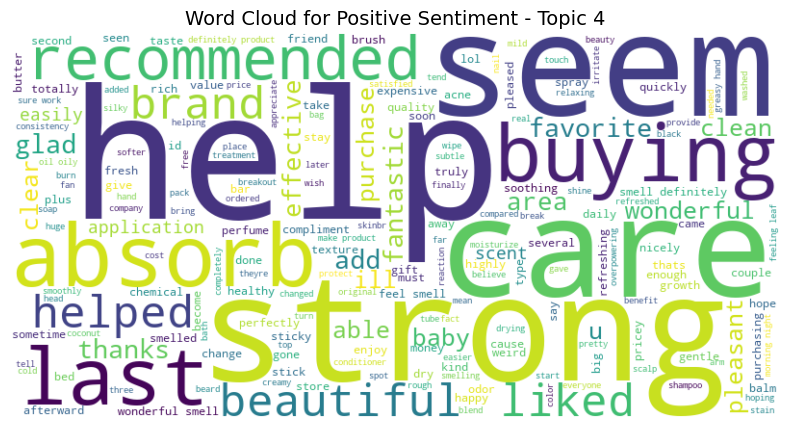

...

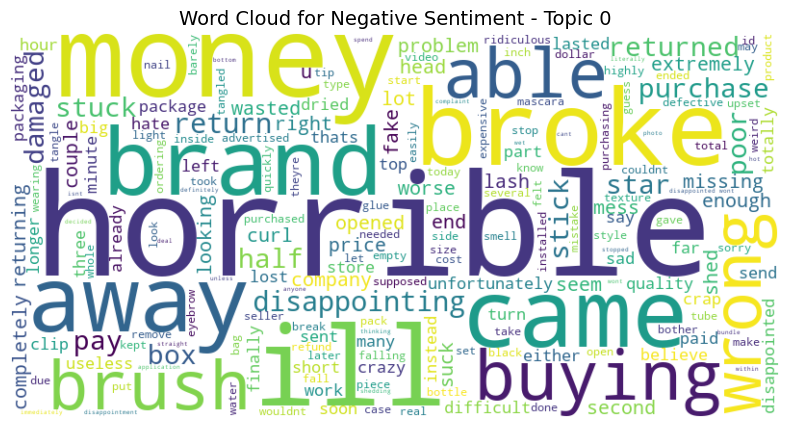

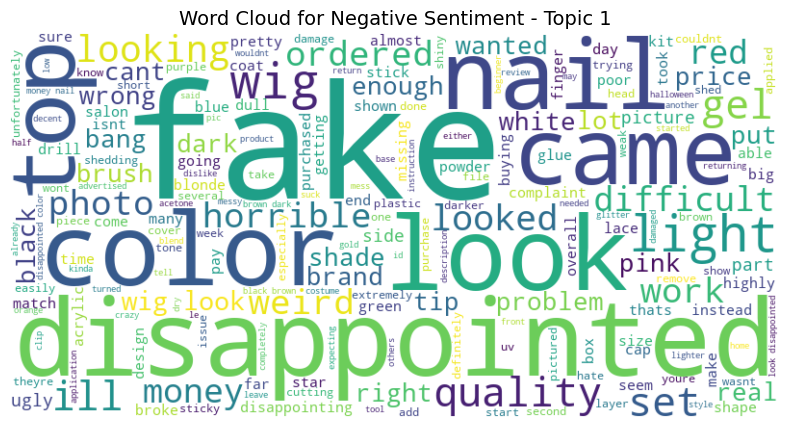

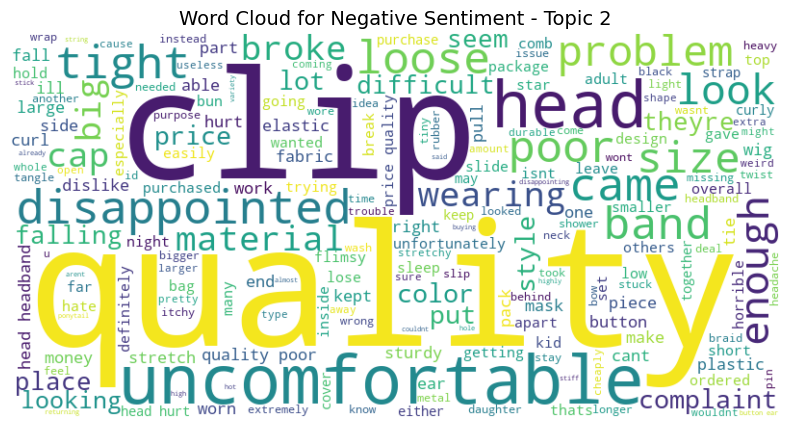

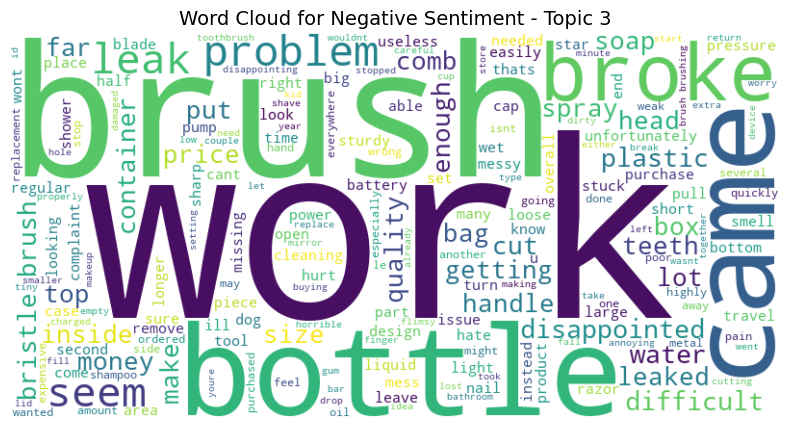

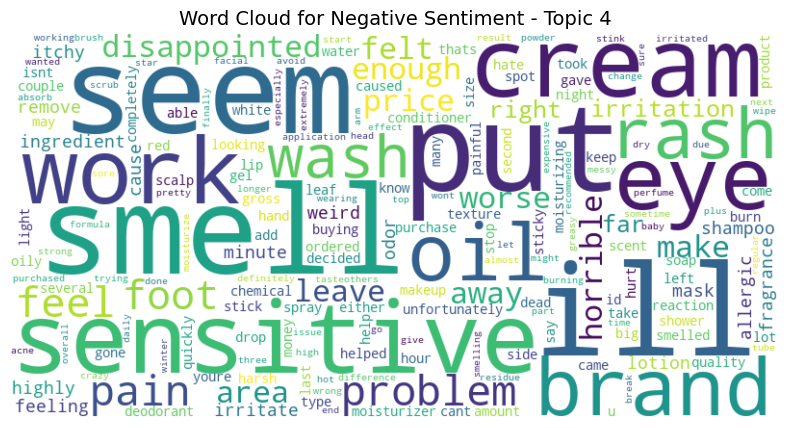

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word clouds for TSM results
def generate_wordclouds_for_sentiments(tsm, lda_model, corpus, sentiment_category, num_topics):
    for topic_id in range(num_topics):
        # Collect texts corresponding to the given topic and sentiment category
        texts = []
        for doc_bow in corpus:
            topic_distribution = lda_model.get_document_topics(doc_bow)
            dominant_topic = max(topic_distribution, key=lambda x: x[1])[0]  # Get topic with highest probability
            if dominant_topic == topic_id:
                document_text = " ".join([lda_model.id2word[word_id] for word_id, _ in doc_bow])
                sentiment = analyzer.polarity_scores(document_text)
                if (
                    (sentiment_category == "Positive" and sentiment["compound"] >= 0.05) or
                    (sentiment_category == "Neutral" and -0.05 < sentiment["compound"] < 0.05) or
                    (sentiment_category == "Negative" and sentiment["compound"] <= -0.05)
                ):
                    texts.append(document_text)

        # Combine all texts into one string
        combined_text = " ".join(texts)

        # Generate word cloud
        if combined_text.strip():  
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color="white",
                colormap="viridis"
            ).generate(combined_text)

            # Plot the word cloud
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.axis("off")
            plt.title(f"Word Cloud for {sentiment_category} Sentiment - Topic {topic_id}", fontsize=14)
            plt.show()
        else:
            print(f"No texts found for {sentiment_category} Sentiment - Topic {topic_id}")

# Generate word clouds for each sentiment category and period
print("\nWord Clouds Before Covid:")
for sentiment in ["Positive", "Neutral", "Negative"]:
    generate_wordclouds_for_sentiments(tsm_before_covid, lda_before_covid, corpus_before, sentiment, num_topics=5)

print("\nWord Clouds After Covid:")
for sentiment in ["Positive", "Neutral", "Negative"]:
    generate_wordclouds_for_sentiments(tsm_after_covid, lda_after_covid, corpus_after, sentiment, num_topics=5)
